In [ ]:
from google.colab import drive  # Access Google Drive in Google Colab
from google.colab import files  # Upload and download files in Colab
import zipfile  # Handle zip files
import shutil  # File and directory operations, like deletion or moving
import os  # Interact with the operating system
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import cv2
import glob as gb
import pandas as pd
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.preprocessing import image_dataset_from_directory
from tensorflow.keras.layers.experimental.preprocessing import RandomFlip, RandomRotation
from tensorflow.keras.layers import Dense, Dropout, Flatten
from tensorflow.keras.layers import Conv2D, MaxPool2D ,LeakyReLU

In [ ]:
# Mount Google Drive
drive.mount('/content/drive')

# Path to file ZIP in Google Drive
zip_path = '/content/drive/MyDrive/dataset/cassava_disease.zip'

Mounted at /content/drive


#Extract zip file

In [ ]:
# Extract zip file
! unzip '/content/drive/MyDrive/dataset/cassava_disease.zip' -d .

Archive:  /content/drive/MyDrive/dataset/cassava_disease.zip
   creating: ./cassava_disease/brown-streak-disease/
  inflating: ./cassava_disease/brown-streak-disease/1616821564298.jpg  
  inflating: ./cassava_disease/brown-streak-disease/1616821564298.xml  
  inflating: ./cassava_disease/brown-streak-disease/1616821573094.jpg  
  inflating: ./cassava_disease/brown-streak-disease/1616821573094.xml  
  inflating: ./cassava_disease/brown-streak-disease/1616821579297.jpg  
  inflating: ./cassava_disease/brown-streak-disease/1616821579297.xml  
  inflating: ./cassava_disease/brown-streak-disease/1616821585769.jpg  
  inflating: ./cassava_disease/brown-streak-disease/1616821585769.xml  
  inflating: ./cassava_disease/brown-streak-disease/1616821602199.jpg  
  inflating: ./cassava_disease/brown-streak-disease/1616821602199.xml  
  inflating: ./cassava_disease/brown-streak-disease/1616821605425.jpg  
  inflating: ./cassava_disease/brown-streak-disease/1616821605425.xml  
  inflating: ./cassava

In [ ]:
path_cassava = '/content/cassava_disease' #Path ke directory file penyakit pisang
cassava_classes = os.listdir(path_cassava) #List kelas penyakit pisang
print(cassava_classes)

['healthy', 'mosaic_disease', 'brown-streak-disease']


In [ ]:
#delete gambar dalam format .xml
# Traverse through all directories and subdirectories
for root, dirs, files in os.walk(path_cassava):
    for file in files:
        # Check if the file is an XML file
        if file.endswith('.xml'):
            file_path = os.path.join(root, file)
            os.remove(file_path)
            print(f"Deleted {file_path}")

Deleted /content/cassava_disease/brown-streak-disease/1617093521972.xml
Deleted /content/cassava_disease/brown-streak-disease/1617099095588.xml
Deleted /content/cassava_disease/brown-streak-disease/1617103336917.xml
Deleted /content/cassava_disease/brown-streak-disease/1617093700523.xml
Deleted /content/cassava_disease/brown-streak-disease/1616833634178.xml
Deleted /content/cassava_disease/brown-streak-disease/1617095202183.xml
Deleted /content/cassava_disease/brown-streak-disease/1617003989203.xml
Deleted /content/cassava_disease/brown-streak-disease/1617092174281.xml
Deleted /content/cassava_disease/brown-streak-disease/1617095534371.xml
Deleted /content/cassava_disease/brown-streak-disease/1616822863664.xml
Deleted /content/cassava_disease/brown-streak-disease/1617097211419.xml
Deleted /content/cassava_disease/brown-streak-disease/1617095989579.xml
Deleted /content/cassava_disease/brown-streak-disease/1616822292607.xml
Deleted /content/cassava_disease/brown-streak-disease/1617093414

#EDA
sekarang mari kita lihat data yang kita punya seperti apa


healthy
Total Images: 522
Resolution of First Image: (4032, 3016, 3)


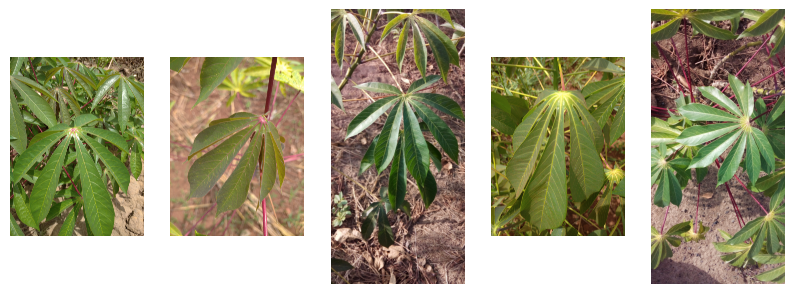


mosaic_disease
Total Images: 1211
Resolution of First Image: (765, 1024, 3)


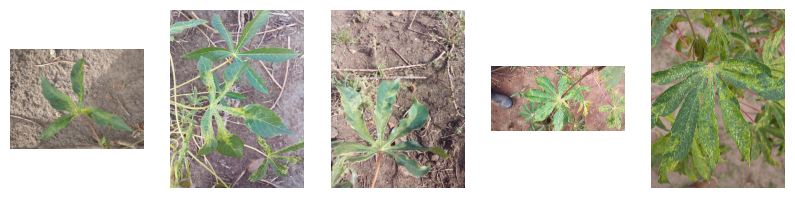


brown-streak-disease
Total Images: 1282
Resolution of First Image: (1024, 1024, 3)


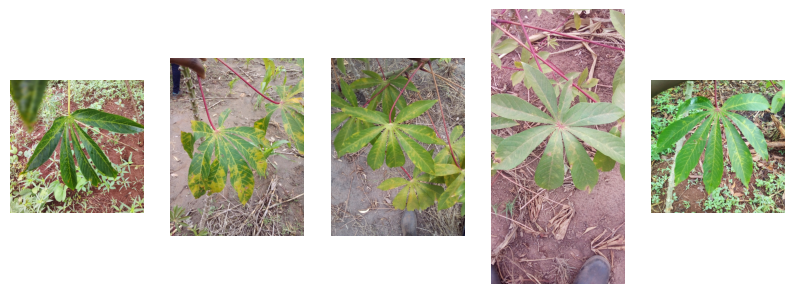

In [ ]:
import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

for item in cassava_classes:
    print("")
    print(item)
    class_dir = os.path.join(path_cassava, item)
    class_images = [f for f in os.listdir(class_dir) if f.endswith(('.png', '.jpg', '.jpeg'))]

    # Total images in each class
    num_images = len(class_images)
    print("Total Images:", num_images)

    if num_images > 0:
        # Resolution/size of each first image in class
        img_path = os.path.join(class_dir, class_images[0])
        img = mpimg.imread(img_path)
        image_shape = img.shape
        print("Resolution of First Image:", image_shape)

        # Showing some images
        plt.figure(figsize=(10, 5))
        for i, img_name in enumerate(class_images[:5]):
            sp = plt.subplot(1, 5, i+1)
            img_path = os.path.join(class_dir, img_name)
            img = mpimg.imread(img_path)
            plt.axis('off')
            plt.imshow(img)
        plt.show()
    else:
        print("No images found in this class.")


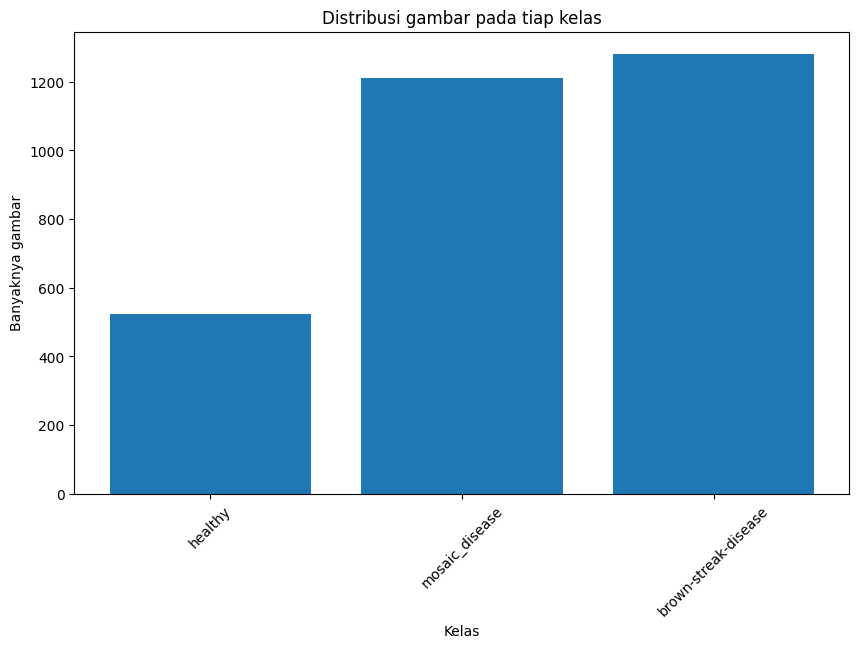

In [ ]:
# Count the number of files in each class directory
class_counts = {}
for cls in cassava_classes:
    cls_path = os.path.join(path_cassava, cls)
    if os.path.isdir(cls_path):
        class_counts[cls] = len(os.listdir(cls_path))

# Plot the distribution
plt.figure(figsize=(10, 6))
plt.bar(class_counts.keys(), class_counts.values())
plt.xlabel('Kelas')
plt.ylabel('Banyaknya gambar')
plt.title('Distribusi gambar pada tiap kelas')
plt.xticks(rotation=45)
plt.show()

terlihat bahwa data memiliki pesebaran yang tidak seimbang di tiap kelasnya, hal ini dapat menyebabkan bias pada model. kelas healthy memiliki data yang kurang dari 1000. oleh karena itu, kita akan melakukan augmentasi agar kelas healthy memiliki data lebih dari 1000.

##mengecilkan resolusi

In [ ]:
#mengecilkan resolusi
from PIL import Image
import os

# Path to your base directory containing all classes
base_dir = '/content/cassava_disease'
output_base_dir = '/content/cassava_disease_resized'  # Base directory to save resized images

# Ensure output base directory exists
if not os.path.exists(output_base_dir):
    os.makedirs(output_base_dir)

# Desired resolution
new_resolution = (224, 224)  # Change this to your desired resolution

# List all class directories
class_dirs = [d for d in os.listdir(base_dir) if os.path.isdir(os.path.join(base_dir, d))]

# Process each class directory
for class_dir in class_dirs:
    input_dir = os.path.join(base_dir, class_dir)
    output_dir = os.path.join(output_base_dir, class_dir)

    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    # List all files in the class directory
    image_files = [f for f in os.listdir(input_dir) if os.path.isfile(os.path.join(input_dir, f))]

    # Process each image file
    for image_file in image_files:
        try:
            # Load the image
            img_path = os.path.join(input_dir, image_file)
            with Image.open(img_path) as img:
                # Resize the image
                img_resized = img.resize(new_resolution, Image.ANTIALIAS)
                # Save the resized image
                img_resized.save(os.path.join(output_dir, image_file))
                print(f"Resized and saved {image_file} in {class_dir}")
        except Exception as e:
            print(f"Error processing {image_file} in {class_dir}: {e}")


<ipython-input-8-b2bf9e74908a>:37: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  img_resized = img.resize(new_resolution, Image.ANTIALIAS)


Resized and saved 1616749172039.jpg in healthy
Resized and saved 1616760420165.jpg in healthy
Resized and saved 1616767475078.jpg in healthy
Resized and saved 1616747210427.jpg in healthy
Resized and saved 1616765762713.jpg in healthy
Resized and saved 1616761871496.jpg in healthy
Resized and saved 1616760410949.jpg in healthy
Resized and saved 1616742944141.jpg in healthy
Resized and saved 1616765677565.jpg in healthy
Resized and saved 1616767603106.jpg in healthy
Resized and saved 1616768243190.jpg in healthy
Resized and saved 1616760751900.jpg in healthy
Resized and saved 1616747237439.jpg in healthy
Resized and saved 1616764914325.jpg in healthy
Resized and saved 1616765733362.jpg in healthy
Resized and saved 1616761672690.jpg in healthy
Resized and saved 1616761255722.jpg in healthy
Resized and saved 1616751745401.jpg in healthy
Resized and saved 1616746415951.jpg in healthy
Resized and saved 1616760582281.jpg in healthy
Resized and saved 1616761056504.jpg in healthy
Resized and s

##augmentasi data healthy

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator, img_to_array, load_img
import numpy as np
import os

# Define the image data generator with desired augmentations
datagen = ImageDataGenerator(
    rotation_range=40,
    horizontal_flip=True,
    brightness_range=[0.5, 1.5],  # adjust brightness
    width_shift_range=0.2,  # horizontal shift
    height_shift_range=0.2
)

# Path to your images
input_dir = '/content/cassava_disease_resized/healthy'
output_dir = '/content/cassava_disease_resized/healthy'  # Same as input_dir to save in the same directory

if not os.path.exists(output_dir):
    os.makedirs(output_dir)

# List all files in the directory
image_files = [f for f in os.listdir(input_dir) if os.path.isfile(os.path.join(input_dir, f))]

# Number of augmentations to create per image
num_augmentations = 1

# Process each image file
for image_file in image_files:
    try:
        # Load the image
        img_path = os.path.join(input_dir, image_file)
        img = load_img(img_path)
        x = img_to_array(img)  # Convert the image to a numpy array
        x = np.expand_dims(x, axis=0)  # Reshape it to (1, height, width, channels)

        # Generate augmentations
        i = 0
        for batch in datagen.flow(x, batch_size=1, save_to_dir=output_dir, save_prefix='aug', save_format='jpeg'):
            i += 1
            if i >= num_augmentations:  # Save a fixed number of augmentations per original image
                break
    except Exception as e:
        print(f"Error processing {image_file}: {e}")


In [ ]:
path_cassava_new = '/content/cassava_disease_resized' #Path ke directory file penyakit pisang
cassava_classes_new = os.listdir(path_cassava_new) #List kelas penyakit pisang
print(cassava_classes_new)

['healthy', 'mosaic_disease', 'brown-streak-disease']



healthy
Total Images: 1032
Resolution of First Image: (224, 224, 3)


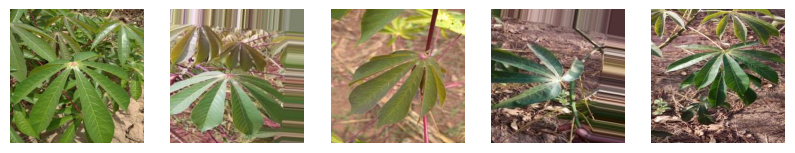


mosaic_disease
Total Images: 1211
Resolution of First Image: (224, 224, 3)


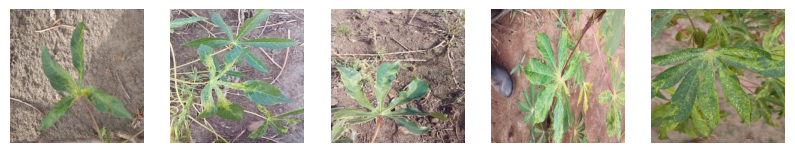


brown-streak-disease
Total Images: 1281
Resolution of First Image: (224, 224, 3)


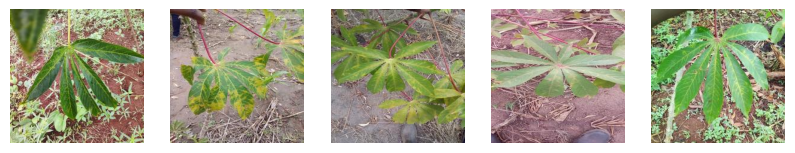

In [ ]:
import matplotlib.image as mpimg
for item in cassava_classes_new:
  print("")
  print(item)
  class_dir = os.path.join(path_cassava_new, item)
  class_images = os.listdir(class_dir)

  # Total images in each classes
  num_images = len(class_images)
  print("Total Images:", num_images)

  # Resolution/size of each first image in class
  img_path = os.path.join(class_dir, class_images[0])
  img = mpimg.imread(img_path)
  image_shape = img.shape
  print("Resolution of First Image:", image_shape)

  # Showing some images
  plt.figure(figsize=(10, 5))
  for i, img_path in enumerate(class_images[:5]):
    sp = plt.subplot(1, 5, i+1)
    img = mpimg.imread(os.path.join(class_dir, img_path))
    plt.axis('off')
    plt.imshow(img)
  plt.show()

In [ ]:
import random
def trim_dataset(base_dir, max_files_per_class=1000):
    for class_folder in os.listdir(base_dir):
        class_path = os.path.join(base_dir, class_folder)

        # Ensure we are working with directories only
        if os.path.isdir(class_path):
            # List all files in the class directory
            files = [f for f in os.listdir(class_path) if os.path.isfile(os.path.join(class_path, f))]

            # Shuffle the files to ensure randomness
            random.shuffle(files)

            # If there are more files than max_files_per_class, delete the excess
            if len(files) > max_files_per_class:
                files_to_delete = files[max_files_per_class:]
                for file_name in files_to_delete:
                    file_path = os.path.join(class_path, file_name)
                    os.remove(file_path)
                    print(f"Removed: {file_path}")

# Path to the main folder containing class subfolders
base_dir = path_cassava_new  # Change this to your directory path

# Trim the dataset
trim_dataset(base_dir)


Removed: /content/cassava_disease_resized/healthy/aug_0_8051.jpeg
Removed: /content/cassava_disease_resized/healthy/aug_0_4885.jpeg
Removed: /content/cassava_disease_resized/healthy/aug_0_1558.jpeg
Removed: /content/cassava_disease_resized/healthy/aug_0_4688.jpeg
Removed: /content/cassava_disease_resized/healthy/aug_0_592.jpeg
Removed: /content/cassava_disease_resized/healthy/aug_0_2437.jpeg
Removed: /content/cassava_disease_resized/healthy/1616765489115.jpg
Removed: /content/cassava_disease_resized/healthy/1616744218387.jpg
Removed: /content/cassava_disease_resized/healthy/1616760359494.jpg
Removed: /content/cassava_disease_resized/healthy/aug_0_6418.jpeg
Removed: /content/cassava_disease_resized/healthy/1616767643347.jpg
Removed: /content/cassava_disease_resized/healthy/1616760742093.jpg
Removed: /content/cassava_disease_resized/healthy/1616760604343.jpg
Removed: /content/cassava_disease_resized/healthy/aug_0_2247.jpeg
Removed: /content/cassava_disease_resized/healthy/aug_0_5662.jpeg

In [ ]:
# Verify the result
for class_folder in os.listdir(base_dir):
    class_path = os.path.join(base_dir, class_folder)
    if os.path.isdir(class_path):
        num_files = len([f for f in os.listdir(class_path) if os.path.isfile(os.path.join(class_path, f))])
        print(f"Class '{class_folder}' now has {num_files} images.")


Class 'healthy' now has 1000 images.
Class 'mosaic_disease' now has 1000 images.
Class 'brown-streak-disease' now has 1000 images.



healthy
Total Images: 1000
Resolution of First Image: (224, 224, 3)


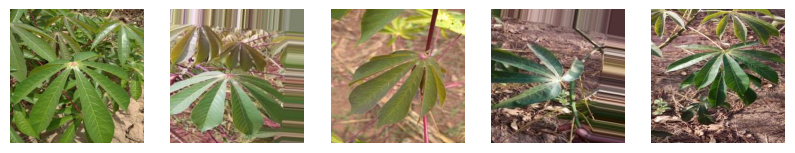


mosaic_disease
Total Images: 1000
Resolution of First Image: (224, 224, 3)


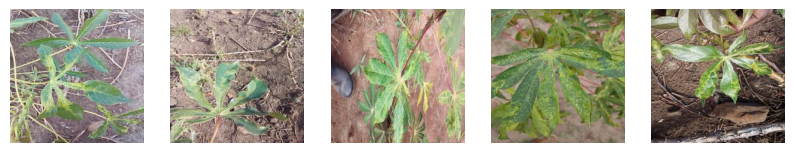


brown-streak-disease
Total Images: 1000
Resolution of First Image: (224, 224, 3)


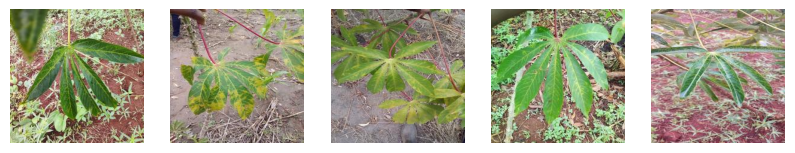

In [ ]:
import matplotlib.image as mpimg
for item in cassava_classes_new:
  print("")
  print(item)
  class_dir = os.path.join(path_cassava_new, item)
  class_images = os.listdir(class_dir)

  # Total images in each classes
  num_images = len(class_images)
  print("Total Images:", num_images)

  # Resolution/size of each first image in class
  img_path = os.path.join(class_dir, class_images[0])
  img = mpimg.imread(img_path)
  image_shape = img.shape
  print("Resolution of First Image:", image_shape)

  # Showing some images
  plt.figure(figsize=(10, 5))
  for i, img_path in enumerate(class_images[:5]):
    sp = plt.subplot(1, 5, i+1)
    img = mpimg.imread(os.path.join(class_dir, img_path))
    plt.axis('off')
    plt.imshow(img)
  plt.show()

#Split dataset menjadi data training, validation, dan test

In [ ]:
pip install split-folders


In [ ]:
import splitfolders

# Define paths
input_folder = path_cassava_new
output_folder = '/content/cassava_disease_working'

# Split the dataset into train and validation
splitfolders.ratio(input_folder, output=output_folder, seed=42, ratio=(0.7, 0.15, 0.15))

Copying files: 3000 files [00:00, 5462.42 files/s]


In [ ]:
path_train = '/content/cassava_disease_working/train' #Path ke directory file penyakit jagung
path_val = '/content/cassava_disease_working/val'
path_test = '/content/cassava_disease_working/test'
classes_train = os.listdir(path_train) #List kelas penyakit jagung
classes_val = os.listdir(path_val) #List kelas penyakit jagung
classes_test = os.listdir(path_test) #List kelas penyakit jagung

print(classes_train)
print(classes_val)
print(classes_test)

['healthy', 'mosaic_disease', 'brown-streak-disease']
['healthy', 'mosaic_disease', 'brown-streak-disease']
['healthy', 'mosaic_disease', 'brown-streak-disease']


#Labelling data menggunakan image augmentation

In [ ]:
#training and validation directories
train_dir = path_train
validation_dir = path_val
test_dir = path_test

In [ ]:
#import training data
train_datagen = ImageDataGenerator(rescale = 1./255)

train_generator=  train_datagen.flow_from_directory(
        train_dir,
        target_size = (150,150),
        batch_size = 32,
        class_mode = 'categorical'
    )

#import validation data
validation_datagen = ImageDataGenerator(rescale = 1./255)

validation_generator = validation_datagen.flow_from_directory(
        validation_dir,
        target_size=(150, 150),
        batch_size=32,
        class_mode='categorical'
    )

#import test data
test_datagen = ImageDataGenerator(rescale = 1./255)

test_generator = test_datagen.flow_from_directory(
        test_dir,
        target_size=(150, 150),
        batch_size=32,
        class_mode='categorical'
    )

Found 2100 images belonging to 3 classes.
Found 450 images belonging to 3 classes.
Found 450 images belonging to 3 classes.


Training Data


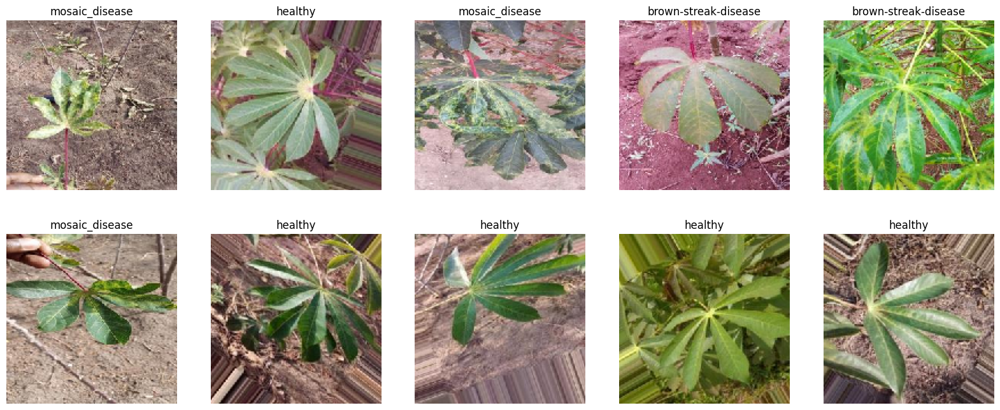

Validation Data


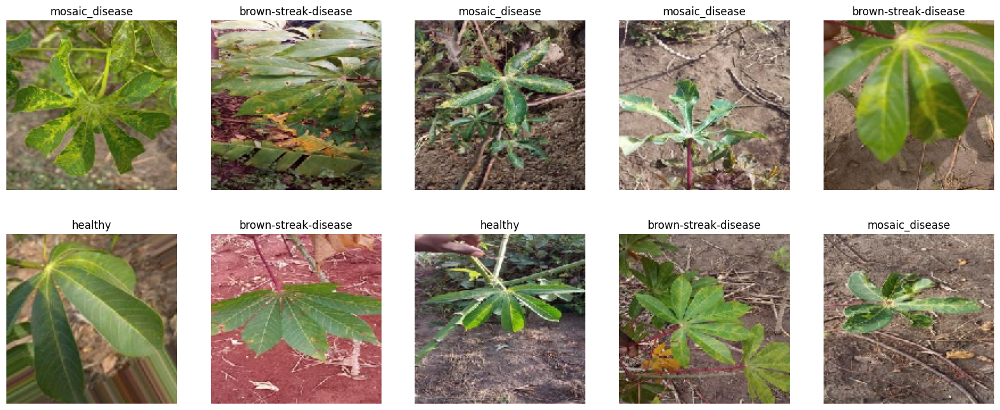

Test Data


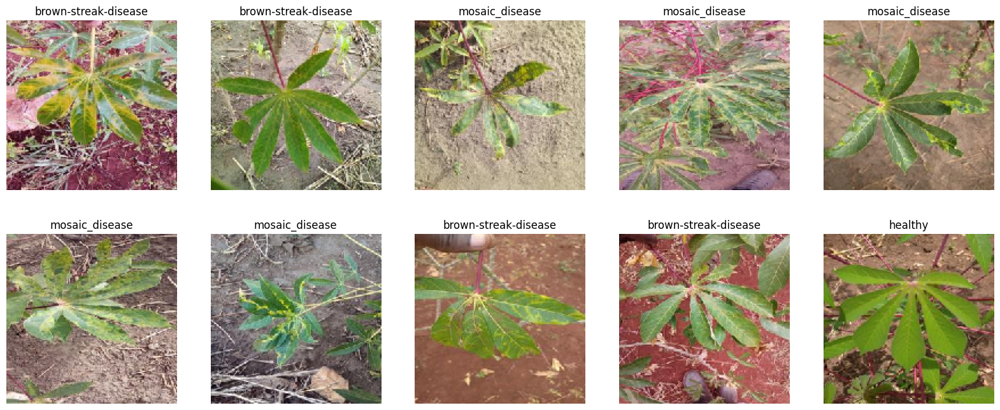

In [ ]:
# Get class indices and invert the dictionary to get class labels
class_indices = train_generator.class_indices
idx_to_class = {v: k for k, v in class_indices.items()}

# Function to plot images with their labels
def plot_images(images, labels, idx_to_class, num_images=10):
    plt.figure(figsize=(20, 8))
    for i in range(num_images):
        plt.subplot(2, 5, i + 1)
        plt.imshow(images[i])
        plt.axis('off')
        label_idx = np.argmax(labels[i])  # Get the index of the highest probability class
        plt.title(idx_to_class[label_idx])
    plt.show()

# Print a batch of training data
images, labels = next(train_generator)
print("Training Data")
plot_images(images, labels, idx_to_class)

# Print a batch of validation data
images, labels = next(validation_generator)
print("Validation Data")
plot_images(images, labels, idx_to_class)

# Print a batch of validation data
images, labels = next(test_generator)
print("Test Data")
plot_images(images, labels, idx_to_class)


#Training

In [ ]:
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras import layers
from tensorflow.keras import Model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.optimizers import RMSprop
import urllib.request

In [ ]:
inceptionv3 = 'https://storage.googleapis.com/mledu-datasets/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5'
urllib.request.urlretrieve( inceptionv3, 'inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5')
local_weights_file = 'inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5'

pre_trained_model =  InceptionV3(input_shape=(150, 150, 3),
                                 include_top=False, weights=None) # YOUR CODE HERE

pre_trained_model.load_weights(local_weights_file)

for layer in pre_trained_model.layers:
  layer.trainable = False

last_layer =  pre_trained_model.get_layer('mixed7') # YOUR CODE HERE
last_output = last_layer.output


In [ ]:
#last layers
x = Flatten()(last_output)
x = Dropout(0.5)(x)
x = Dense(64, activation='relu')(x)
x = Dropout(0.5)(x)
x = layers.Dense(3, activation='softmax')(x)

In [ ]:
#pre-trained model
model = Model(pre_trained_model.input, x)

#compile model
model.compile(optimizer=RMSprop(lr=0.0001),
                  loss='categorical_crossentropy',
                  metrics=['acc'])

model.summary()

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_4 (InputLayer)        [(None, 150, 150, 3)]        0         []                            
                                                                                                  
 conv2d_282 (Conv2D)         (None, 74, 74, 32)           864       ['input_4[0][0]']             
                                                                                                  
 batch_normalization_282 (B  (None, 74, 74, 32)           96        ['conv2d_282[0][0]']          
 atchNormalization)                                                                               
                                                                                                  
 activation_282 (Activation  (None, 74, 74, 32)           0         ['batch_normalization_28

In [ ]:
class myCallback(tf.keras.callbacks.Callback):
        def on_epoch_end(self, epoch, logs={}):
            if(logs.get('acc') > 0.93 and logs.get('val_acc') > 0.89):
                print("\n Accuracy is more than 93%, stopping...")
                self.model.stop_training = True

customCallback = myCallback()

In [ ]:
history = model.fit(
        train_generator,
        validation_data=validation_generator,  # Added validation data here
        epochs=30,
        verbose=1,
        steps_per_epoch=40,
        callbacks=[customCallback]
        )

Epoch 1/30
40/40 [==============================] - 7s 84ms/step - loss: 1.1129 - acc: 0.6199 - val_loss: 0.5642 - val_acc: 0.7378
Epoch 2/30
40/40 [==============================] - 3s 75ms/step - loss: 0.5669 - acc: 0.7641 - val_loss: 0.5171 - val_acc: 0.7667
Epoch 3/30
40/40 [==============================] - 4s 103ms/step - loss: 0.4693 - acc: 0.8044 - val_loss: 0.4462 - val_acc: 0.8156
Epoch 4/30
40/40 [==============================] - 3s 68ms/step - loss: 0.4138 - acc: 0.8453 - val_loss: 0.4164 - val_acc: 0.8378
Epoch 5/30
40/40 [==============================] - 2s 60ms/step - loss: 0.3521 - acc: 0.8648 - val_loss: 0.3371 - val_acc: 0.8733
Epoch 6/30
40/40 [==============================] - 2s 57ms/step - loss: 0.3003 - acc: 0.8820 - val_loss: 0.3516 - val_acc: 0.8578
Epoch 7/30
40/40 [==============================] - 4s 97ms/step - loss: 0.2591 - acc: 0.9069 - val_loss: 0.3304 - val_acc: 0.8867
Epoch 8/30
40/40 [==============================] - 3s 76ms/step - loss: 0.2538 - 

#Evaluasi model

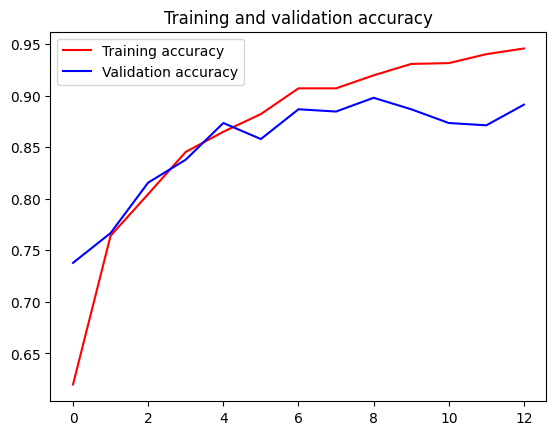

<Figure size 640x480 with 0 Axes>

In [ ]:
import matplotlib.pyplot as plt

# Plot the results
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'r', label='Training accuracy')
plt.plot(epochs, val_acc, 'b', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend(loc=0)
plt.figure()

plt.show()

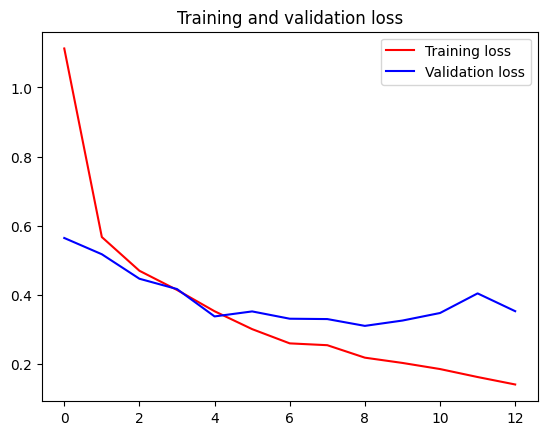

<Figure size 640x480 with 0 Axes>

In [ ]:
plt.plot(epochs, loss, 'r', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend(loc=0)
plt.figure()

plt.show()

In [ ]:
test_loss, test_accuracy = model.evaluate(test_generator)
print("test Accuracy:", test_accuracy)

15/15 [==============================] - 1s 57ms/step - loss: 0.4345 - acc: 0.8622
test Accuracy: 0.8622221946716309


#Save model

In [ ]:
model.save("cassava_inception_model.h5")

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


#Tes akurasi model menggunakan foto tanaman singkong

In [ ]:
model_load = tf.keras.models.load_model('/content/cassava_inception_model.h5')

Saving 1703596720524.jpg to 1703596720524 (1).jpg
1/1 [==============================] - 0s 34ms/step

Predict:
healthy

Probablity:
healthy : 86.62%
mosaic_disease : 9.68%
brown-streak-disease : 3.70%


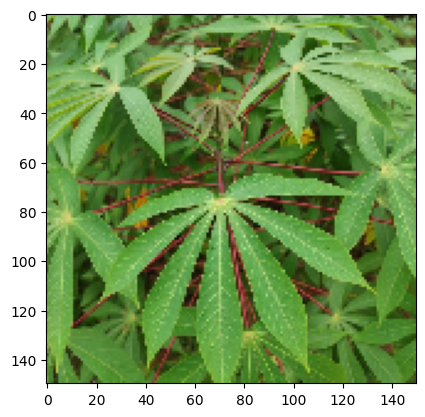

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image
from google.colab import files  # Only if you're using Google Colab or a similar environment

# get user image input
labels = ['healthy', 'mosaic_disease', 'brown-streak-disease']

uploaded = files.upload()

for path in uploaded.keys():
  img = image.load_img(path, target_size=(150,150))
  imgplot = plt.imshow(img)
  x = image.img_to_array(img)
  x = np.expand_dims(x, axis=0)

  images = np.vstack([x])
  images /= 255

  classes = model_load.predict(images, batch_size=32)
  predicted_class_indices=np.argmax(classes)


print("\nPredict:")
if predicted_class_indices == 0:
  print('healthy')
elif predicted_class_indices == 1:
  print('mosaic disease')
elif predicted_class_indices == 2:
  print('brown streak disease')


print("\nProbablity:")
for idx, val in enumerate(labels):
  print("{} : {:.2f}%".format(val, classes[0][idx] * 100))